# Рынок заведений общественного питания Москвы

## Описание проекта
Инвесторы из фонда `«Shut Up and Take My Money»` решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.


Наша **задача** — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Описание данных
Пред нами данные о заведениях общественного питания Москвы, составленный на основе информации сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 


*Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.*


Файл `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽» и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт 
        медиана этих 2 значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», в столбец
        ничего не войдёт.
        
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт 
        медиана этих 2 значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», 
        в столбец ничего не войдёт.
        
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым

- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

## Откроем файл с даными и изучим общую информацию:

Импортируем необходимые библиотеки, считываем данные из csv-файла в датафрейм и сохраняем в переменную data.

In [1]:
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)
sns.set(rc={'figure.figsize':(10, 8)})
import pylab as pl
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import math as mth
import warnings
warnings.filterwarnings('ignore') 
import scipy.stats as stats
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors as mcolors
import re
import folium
from pandas.io.json import json_normalize
from pprint import pprint
import json
import os

from folium.plugins import MarkerCluster
from functools import reduce
idx = pd.IndexSlice
from matplotlib.ticker import FuncFormatter
from scipy import stats as sts

In [115]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

Выведем первые 10 строчек датафрейма data на экран.

In [116]:
pd.set_option('display.max_columns', None)
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Выведем основную информацию о датафрейме:

In [117]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


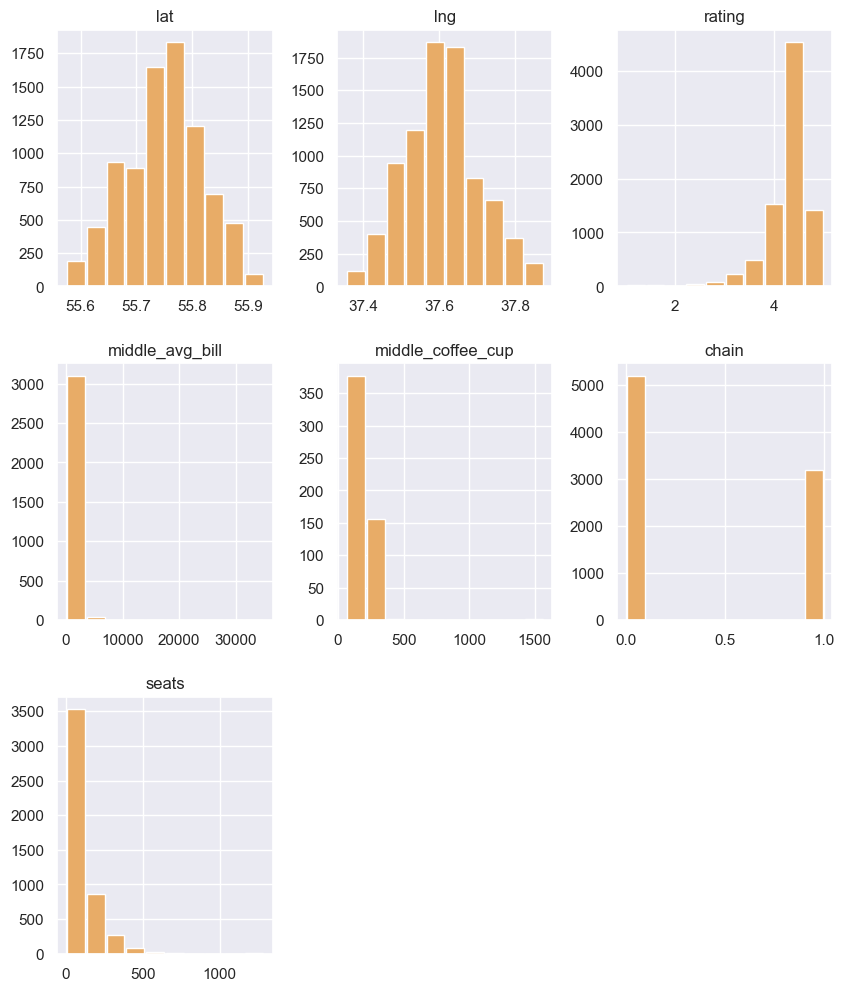

In [118]:
data.hist(figsize=(10, 12), color='#E8AC67', rwidth=0.9);

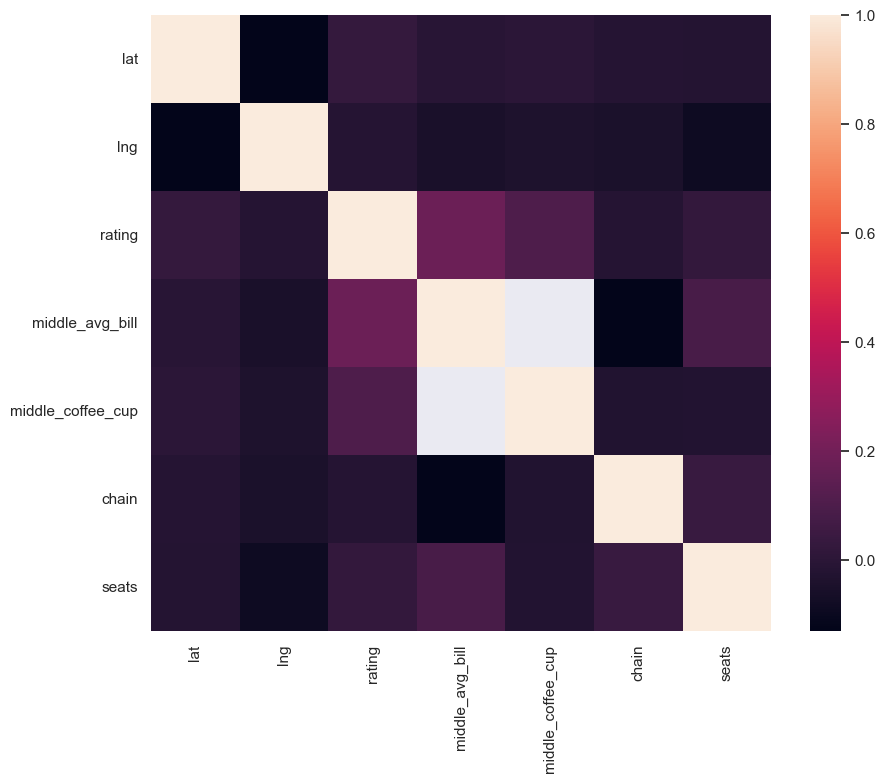

In [119]:
sns.heatmap(data.corr());

На тепловой карте определяется корреляция между показателями `средний чек` и  `средняя стоимость чашки капучино` 

`В датафрейме 14 столбцов и 8406 строк, в некоторых встречаютя пропуски. 
Займемся предобработкой данных:`
    
    
## Выполним предобработку данных

In [120]:
# вывыедем типы заведений, представленные в таблице
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

### Определим наличие дубликатов

In [121]:
# для начала приведем названия заведений и адреса к нижнему регистру для устранения возмоных дубликатов
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [122]:
# определим наличие явных дубликатов
print('Явных дубликатов', data.duplicated().sum())

Явных дубликатов 0


In [123]:
# определим наличие дубликатов по названию, адресу и категории заведения
print('Дубликатов по названию, адресу и категории заведения',\
      data.duplicated(subset=['name', 'address', 'category']).sum())

Дубликатов по названию, адресу и категории заведения 2


In [124]:
print('Всего в датафрейме представлено', data['name'].count(), 'заведений')

Всего в датафрейме представлено 8406 заведений


### Определим наличие пропусков в данных

In [125]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В 6 столбцах из 14 обнаружены пропущеные значения, определим процентное соотношение пропусков

In [126]:
data_pct =[]
data_pct_name = []
for col in data:
    pct = np.mean(data[col].isnull()) 
    data_pct_name.append(col)
    data_pct.append(round(pct*100,1))

df_pct = pd.DataFrame(data_pct, index = data_pct_name, columns = ['%'])

In [127]:
df_pct.style.background_gradient(cmap = 'PuBu', text_color_threshold = 0.5,\
                                  vmin = 1.5 , vmax = 10, axis=None)

,%
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


В столбцах:  
- `hours` (дни/время работы) более 6% пропущенных значений информация о днях и часах работы
- `price` (категория цен) 61%
- `avg_bill` (диапазон средней стоимости заказа)
- `middle_avg_bill` (число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт») 62%     
- `middle_coffee_cup` (число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино») 93%
- `seats` (количество посадочных мест) 43%

 Удялить из датафрейма такой объем информации мы не можем, заполнить синтетичсекими значениями (например, медианой/средним/..) так же не целесообразно, так как может привести к значительному искажению результатов исследования. 
 В связи с тем, что произвести обработку пропусков не предоставляется возможным, оставим данные в таком виде.

### Создайте столбец `street` с названиями улиц из столбца с адресом.

In [128]:
# создадим список ключевых слов
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд','аллея','бульвар','набережная']
stop_str = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
data['street'] = data['address'].str.extract(stop_str, flags=re.I)    
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица


In [129]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

### Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

- логическое значение `True` — если заведение работает ежедневно и круглосуточно;
- логическое значение `False` — в противоположном случае.

In [130]:
times_work = data['hours'].to_list()
list_time = []

for time in times_work:
    if time == "ежедневно, круглосуточно":
        list_time.append(True),
    else: list_time.append(False)
data['is_24/7'] = list_time
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


In [131]:
#проверим корректность заполнения нового столбца 
data['is_24/7'].unique()

array([False,  True])

На данном этапе мы определили наличие дубликатов и пропусков в датафрейме, создали необходимые для дальнейшего анализа столбцы.

## Анализ данных

### Определим, какие категории заведений представлены в данных. 

In [132]:
#создадим таблицу с указанием количесва заведений каждой кстегории
categorys = data['category'].value_counts().to_frame().reset_index()
categorys.columns = ['category', 'count']
categorys

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


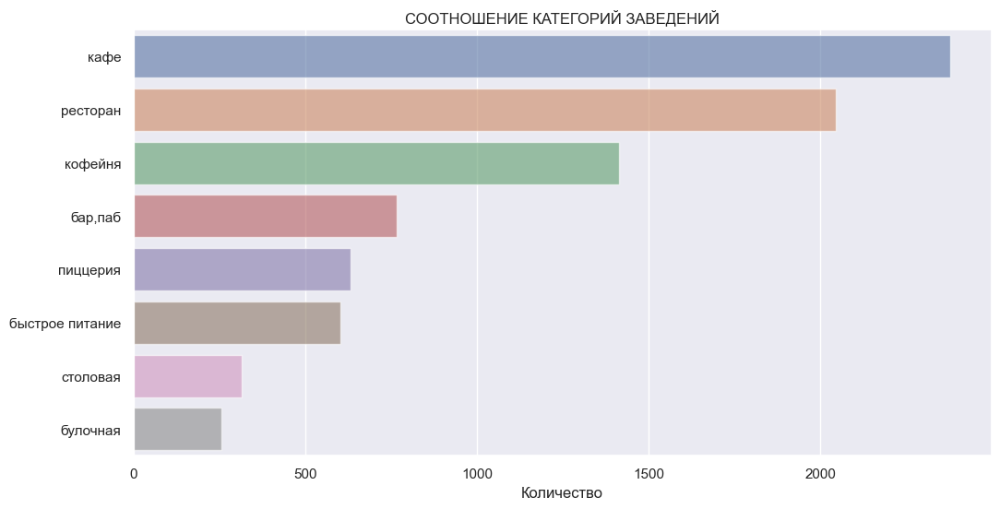

In [133]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='category', 
                 data=categorys, 
                 orient='h', alpha=0.6)
ax.set_title('СООТНОШЕНИЕ КАТЕГОРИЙ ЗАВЕДЕНИЙ')
ax.set_xlabel('Количество') 
ax.set_ylabel('')
plt.show()

In [134]:
#построим круговую диаграмму
go.Figure(data=[go.Pie(labels=categorys['category'], values=categorys['count'])], 
          layout=go.Layout(title=go.layout.\
           Title(text="СООТНОШЕНИЙ КАТЕРИГОЙ ЗАВЕДЕНИЙ")))


Как видно из графиков, более `50%` заведений - это `кафе` (в количестве 2378)  и `рестораны` (2043), кафе при этом на 4% больше.
Третьи по численности - `кофейни`, на них приходится около `17%` - 1413 штук. Далее примерно одинаково распределены категории `бар,паб` (`9%`) ,`пиццерия`(`7.5%`) и `быстрое питание`(`7.2%`), с небольшим отрывом лидируют объекты `бар,паб`. Меньше всего по 3-4% приходится на `столовые` и `булочные`.

### Исследуем количество посадочных мест по категориям:


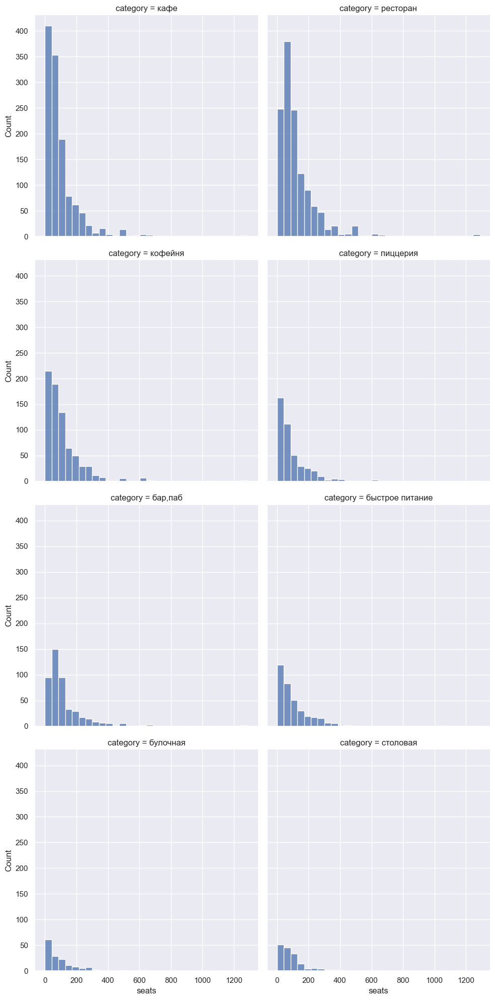

In [135]:
sns.displot(data, x='seats', bins=30, col='category', col_wrap=2)
ax.set_title('КОЛИЧЕСТВО ПОСАДОЧНЫХ МЕСТ ПО КАТЕГОРИЯМ')
ax.set_xlabel('количество мест') 
ax.set_ylabel('категория заведения')
plt.show();

С количеством посадочных мест более 200 встречаются кафе, рестораны и кофейни, при этом заведения этих категорий встречаются и с меньшим количеством мест - до 50. Распределение мест для пиццерий и заведений быстрого питания примерно одинаково. Меньше всего посадочных мест предучсмотрено в столовых и булочных.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

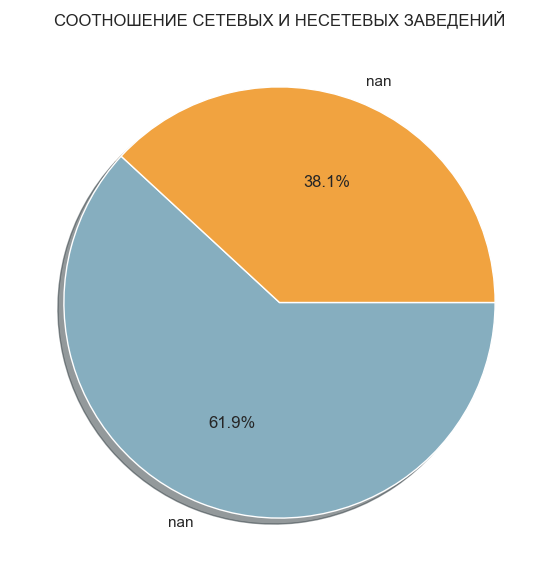

In [136]:
data_chain = data.groupby('chain').agg(count=('name','count')).reset_index()
data_chain

plt.figure(figsize=(7, 7))
colors = ['#86AEBF', '#F1A340']
plt.pie(data_chain['count'],
        labels=data_chain['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), 
        colors=colors,
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ')
plt.show()

62% заведений - несетевые. Определим, какие категории заведений чаще являются сетевыми:

,category,chain_count,total_count,%%
1,булочная,157,256,61.328125
5,пиццерия,330,633,52.132701
4,кофейня,720,1413,50.955414
2,быстрое питание,232,603,38.474295
6,ресторан,730,2043,35.731767
3,кафе,779,2378,32.758621
7,столовая,88,315,27.936508
0,"бар,паб",169,765,22.091503


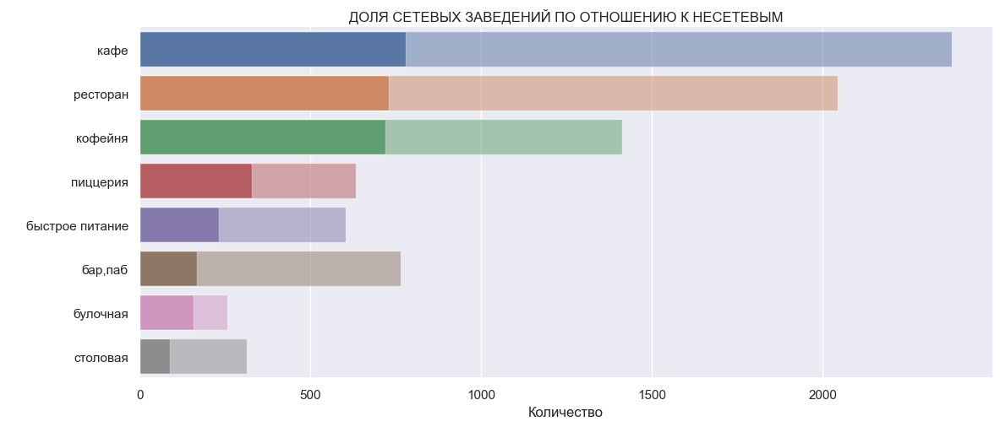

In [137]:
data_chain_type = data.groupby('category').agg({'chain' : 'sum',
                                'name' : 'count'}).reset_index()
data_chain_type.columns = ['category', 'chain_count', 'total_count']
data_chain_type['%%'] = data_chain_type['chain_count'] / data_chain_type['total_count']\
                        * 100
data_chain_type = data_chain_type.sort_values('chain_count', ascending=False)
display(data_chain_type.sort_values(by='%%', ascending=False))

ax = sns.catplot(data=data_chain_type, 
                 kind="bar", 
                 x="chain_count", 
                 y="category",               
                 alpha=1, 
                 aspect=12/5)
ax1 = sns.barplot(x='total_count', y='category', data=data_chain_type, alpha=0.5,\
                  orient='h')
ax.set_axis_labels('Количество', ' ')
plt.title('ДОЛЯ СЕТЕВЫХ ЗАВЕДЕНИЙ ПО ОТНОШЕНИЮ К НЕСЕТЕВЫМ')
plt.show()

Наибольшее количество сетевых заведений приходится на `кафе`, чуть меньше - на`кофейни` и `рестораны`. При этом относительно общего количества заведений каждой категории сетевых встречается больше в категории `булочные` - более 60% сетевые (при этом, общее количество заведений этого типа в нашей выборке минимально)


### Найдем топ-15 популярных сетей в Москве
Сгруппируем данные по названиям заведений и найдем топ-15 по количеству заведений этой сети в регионе. 

In [138]:
top_chain = data[data['chain'] == 1]['name'].value_counts().head(15)

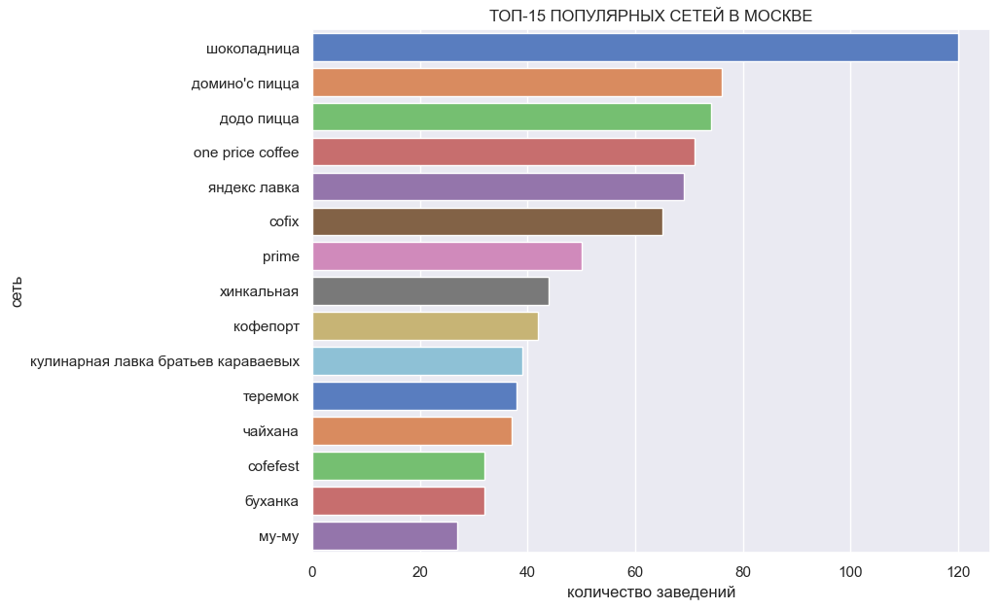

In [139]:
y = top_chain.index

plt.figure(figsize=(9,7))
sns.barplot(x=top_chain, y=y, data=top_chain.reset_index(), palette='muted')
plt.title('ТОП-15 ПОПУЛЯРНЫХ СЕТЕЙ В МОСКВЕ')
plt.xlabel('количество заведений')
plt.ylabel('сеть')

plt.show()



Уточним, к каким категориям относятся данные сети:

In [140]:
top_chain = data[data['name'].isin(list(top_chain.index))]
top_chain.groupby('name')['category'].unique().reset_index()

,name,category
0,cofefest,"[кофейня, кафе]"
1,cofix,[кофейня]
2,one price coffee,[кофейня]
3,prime,"[ресторан, кафе]"
4,буханка,"[булочная, кофейня, кафе]"
5,додо пицца,[пиццерия]
6,домино'с пицца,[пиццерия]
7,кофепорт,[кофейня]
8,кулинарная лавка братьев караваевых,[кафе]
9,му-му,"[кафе, ресторан, кофейня, быстрое питание, пиц..."


Самая крупная сеть - `шоколадница`, в сети есть кофейни и кафе. 3 сети `пиццерий`, 6 сетей с зааведениями катеригории `кофейня`, 7 - `кафе`. `Яндекс лавка` в датасете отнесена к ресторанам, по факту - это склад Яндекс лавки с доставкой из ближайших ресторанов.

В топ-15 вошли в основном крупные федеральные сети.

### Определим, какие административные районы Москвы присутствуют в датасете.
Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [141]:
moscow_district = data.groupby('district')['category'].value_counts().to_frame()
moscow_district.columns = ['Amount']
moscow_district.index = moscow_district.index.set_names(['District', 'Category'])
moscow_district

Amount
District                         Category               
Восточный административный округ кафе                272
                                 ресторан            160
                                 кофейня             105
                                 пиццерия             72
                                 быстрое питание      71
...                                                  ...
Южный административный округ     быстрое питание      85
                                 пиццерия             73
                                 бар,паб              68
                                 столовая             44
                                 булочная             25

[72 rows x 1 columns]

In [142]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [143]:
# фильтрация по округам
sao = data[data['district'] == 'Северный административный округ'].groupby('category')['name']\
    .count().sort_values(ascending=False)
uao = data[data['district'] == 'Южный административный округ'].groupby('category')['name']\
    .count().sort_values(ascending=False)
svao = data[data['district'] == 'Северо-Восточный административный округ'].groupby('category')\
    ['name'].count().sort_values(ascending=False)
szao = data[data['district'] == 'Северо-Западный административный округ'].groupby('category')\
    ['name'].count().sort_values(ascending=False)
cao = data[data['district'] == 'Центральный административный округ'].groupby('category')\
    ['name'].count().sort_values(ascending=False)
vao = data[data['district'] == 'Восточный административный округ'].groupby('category')\
    ['name'].count().sort_values(ascending=False)
zao = data[data['district'] == 'Западный административный округ'].groupby('category')['name']\
    .count().sort_values(ascending=False)
uvao = data[data['district'] == 'Юго-Восточный административный округ'].groupby('category')\
    ['name'].count().sort_values(ascending=False)
uzao = data[data['district'] == 'Юго-Западный административный округ'].groupby('category')\
    ['name'].count().sort_values(ascending=False)
     

In [144]:
plot = go.Figure(data=[go.Bar(
    name='САО',
    x=sao.index,
    y=sao.values
),
    go.Bar(
    name='ЮАО',
    x=uao.index,
    y=uao.values
),
    go.Bar(
    name='ВАО',
    x=vao.index,
    y=vao.values    
),
    go.Bar(
    name='ЗАО',
    x=zao.index,
    y=zao.values    
),
    go.Bar(
    name='ЦАО',
    x=cao.index,
    y=cao.values    
),
    go.Bar(
    name='СЗАО',
    x=szao.index,
    y=szao.values    
),
    go.Bar(
    name='СВАО',
    x=svao.index,
    y=svao.values    
),
    go.Bar(
    name='ЮЗАО',
    x=uzao.index,
    y=uzao.values    
),
    go.Bar(
    name='ЮВАО',
    x=uvao.index,
    y=uvao.values    
)], 
    layout= {'title': 'ОБЩЕЕ КОЛ-ВО ЗАВЕДЕНИЙ КАЖДОЙ КАТЕГОРИИ ПО РАЙОНАМ'})

plot.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="округ",
                     method="update",
                     args=[{"visible": [True, True, True, True, True,\
                                        True, True, True, True]}]),
                dict(label="Северный АО",
                     method="update",
                     args=[{"visible": [True, False, False, False, False,\
                                        False, False, False, False]}]),
                dict(label="Южный АО",
                     method="update",
                     args=[{"visible": [False, True, False, False, False,\
                                        False, False, False, False]}]),
                dict(label="Восточный АО",
                     method="update",
                     args=[{"visible": [False, False, True, False, False,\
                                        False, False, False, False]}]),
                dict(label="Западный АО",
                     method="update",
                     args=[{"visible": [False, False, False, True, False,\
                                        False, False, False, False]}]),
                dict(label="Центральный АО",
                     method="update",
                     args=[{"visible": [False, False, False, False, True,\
                                        False, False, False, False]}]),
                dict(label="Северо-Западный АО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False,\
                                        True, False, False, False]}]),
                dict(label="Северо-Восточный АО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False,\
                                        False, True, False, False]}]),
                dict(label="Юго-Западный АО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False,\
                                        False, False, True, False]}]),
                dict(label="Юго-Восточный АО",
                      method="update",
                     args=[{"visible": [False, False, False, False, False,\
                                        False, False, False, True]}]),
            ]),
        )
    ], barmode='stack', 
    autosize=False, 
    width=900, 
    height=800)

plot.show()
     

В датафрейме представлено 9 административных округов: `Северный, Северо-Восточный, Северо-Западный, Западный, Центральный, Восточный, Юго-Восточный, Южный, Юго-Западный` административный округ.


Мы построили график распределения общего количества заведений и количества заведений по категориям для каждого административного округа.
Самые распространненные категории - `кафе`, `рестораны` и `кофейни`. В Центральном административном округе большое количество `баров, пабов` (примерно такое же, как в остальных округах в сумме). 
Количество заведений типов `пиццерия`, `быстрое питание`, `столовая`, `булочная` меньше во всех районах. Остальные категории менее популярны.
Отметим, что по количеству заведений всех типов лидирует Центральный АО, а Северо-Западный отстает так же по всем позициям. В остальных округах распределение почти равномерное.

Отдельно рассмотрим категорию `кофейня` - наибольшая конкуренция определяется в `ЦАО(428 заведений)`, натменьшая в `ВАО (105 кофеен)`, `ЮЗАО(96)`, `ЮВАО(89)` и `СЗАО(62)`.


### Визуализируйте распределение средних рейтингов по категориям заведений. 


Для начала определим, как различаются усреднённые рейтинги в разных типах общепита:


In [145]:
rating_category = data.groupby('category')['rating'].mean().sort_values(ascending=False)

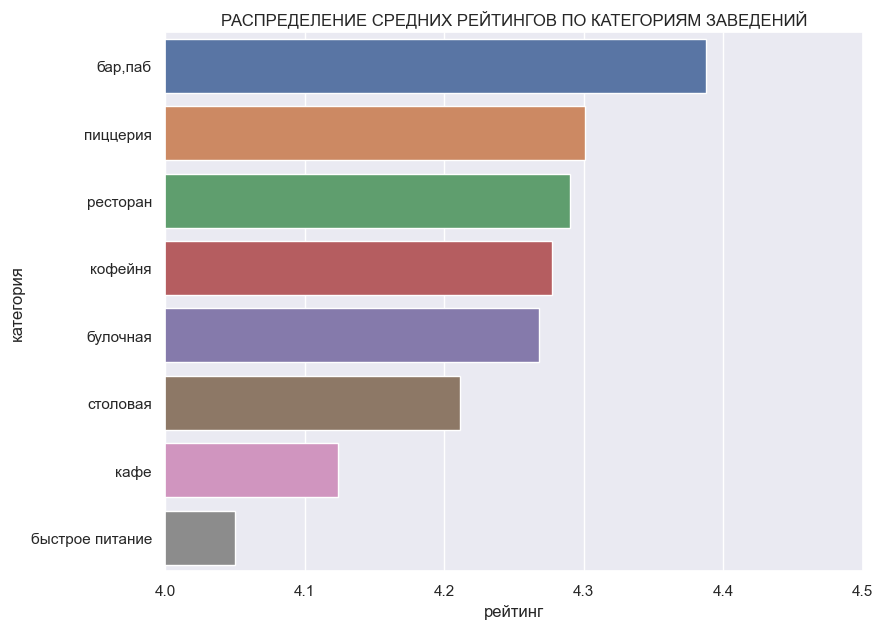

In [146]:
y = rating_category.index

plt.figure(figsize=(9,7))
sns.barplot(x=rating_category, y=y, data=rating_category.reset_index())
plt.xlim(4, 4.5)

plt.title('РАСПРЕДЕЛЕНИЕ СРЕДНИХ РЕЙТИНГОВ ПО КАТЕГОРИЯМ ЗАВЕДЕНИЙ')
plt.xlabel('рейтинг')
plt.ylabel('категория')

plt.show()

Самый высокий рейтинг получили `бары, пабы` - почти 4,4, у `пиццерий` средний рейтинг 4,3, средний рейтинг `ресторанов, кофеен, булочных и столовых` от 4,2 до 4,3, у категории `кафе` рейтинг чуть выше 4,1 , а самый низкий - у заведений `быстрого питания`. 


Рассмотрим, как различаются средние рейтинги заведений каждого района, для этого построим 
**картограмму средних рейтингов заведений по районам:**

In [147]:
with open(os.path.abspath('admin_level_geomap.geojson'), 'r') as f:
        geo_json = json.load(f)
        json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True)

In [148]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# карта Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)


df = data.groupby('district')['rating'].mean()

# создадим хороплет с помощью конструктора Choropleth и добавим его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выведем карту
m

- Наиболее высокий средний рейтинг заведений - в `Центральном административном округе` Москвы (`4.33-4.38`)
- Второй округ по уровню среднего рейтинга - `Северный` (`4.24-4.29`)
- Чуть ниже - в `Северо-Западном` административном округе (`4.19-4.24`)
- Самый низкий средний рейтинг (`4.10-4.15`) - в `Юго-Восточном` АО
- `В остальных районах` средний рейтинг составляет `4.15-4.19`



### Отобразим все заведения датасета на карте 

In [149]:
# создадим пустой кластер, добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применим функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выведем карту
m


### Найдем топ-15 улиц по количеству заведений: 

In [150]:
data.groupby('street')['name'].count().sort_values(ascending=False).head(15)

street
проспект мира             184
профсоюзная улица         122
проспект вернадского      108
ленинский проспект        107
ленинградский проспект     95
дмитровское шоссе          88
каширское шоссе            77
варшавское шоссе           75
ленинградское шоссе        69
люблинская улица           60
улица вавилова             55
кутузовский проспект       54
улица миклухо-маклая       49
пятницкая улица            48
алтуфьевское шоссе         47
Name: name, dtype: int64

In [151]:
top_15_streets = data[data['street'].isin(
    data.groupby('street')['name'].count()
    .sort_values(ascending=False).head(15).index)]
top_15_streets_and_cat = top_15_streets.groupby(['street', 'category'],\
                                                as_index=False)['name'].count()
top_15_streets_and_cat.rename({'name' : 'quantity'}, axis=1, inplace=True)
     

fig = px.bar(top_15_streets_and_cat, x='street', y='quantity', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title=\
    'ГРАФИК РАСПРЕДЕЛЕНИЯ КОЛИЧЕСТВА ЗАВЕДЕНИЙ И ИХ КАТЕГОРИЙ ПО УЛИЦАМ (ТОП-15)',
                   xaxis_title='улица',
                   yaxis_title='количество заведений',
                   autosize=False,
                   width=900,
                   height=800,
                   xaxis={'categoryorder':'total descending'})
fig.show()
     
    

- Больше всего заведений (более 180) распологается на `Проспекте Мира`, в том числе 36 кофеен, 45 ресторанов и 53 кафе.
- На `Профсоюзной улице, проспекте Вернадского, Ленинском проспекте, Ленинградском проспекте, Дмитровском шоссе, Каширском шоссе, Варшавской улице и Ленинградском шоссе` от 70 до 120 заведений с примерно одинаковым распределением по категориям.
- Следующие по количеству заведений `Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица, Алтуфьевское шоссе` от 60 до 47 заведений.

- больше всего кофеен (36) на `проспекте Мира`, меньше всего (4) на `улице Миклухо-Маклая`.


### Найдем улицы, на которых находится только один объект общепита.

In [152]:
one_street = data.groupby('street')['name'].count() == 1
one_street = one_street[one_street.values == True]
one_street

street
1-й автозаводский проезд      True
1-й балтийский переулок       True
1-й варшавский проезд         True
1-й вешняковский проезд       True
1-й голутвинский переулок     True
                              ... 
чонгарский бульвар            True
шоссейный проезд              True
электрический переулок        True
якиманский переулок           True
яковоапостольский переулок    True
Name: name, Length: 403, dtype: bool

Определим, в каких административных округах расположены эти улицы:

In [153]:
one_street = data[data['street'].isin(one_street.index)]
     

one_street.groupby('district')['street'].count().sort_values(ascending=False)

district
Центральный административный округ         128
Восточный административный округ            48
Северо-Восточный административный округ     48
Северный административный округ             45
Южный административный округ                36
Западный административный округ             35
Юго-Восточный административный округ        32
Северо-Западный административный округ      17
Юго-Западный административный округ         14
Name: street, dtype: int64

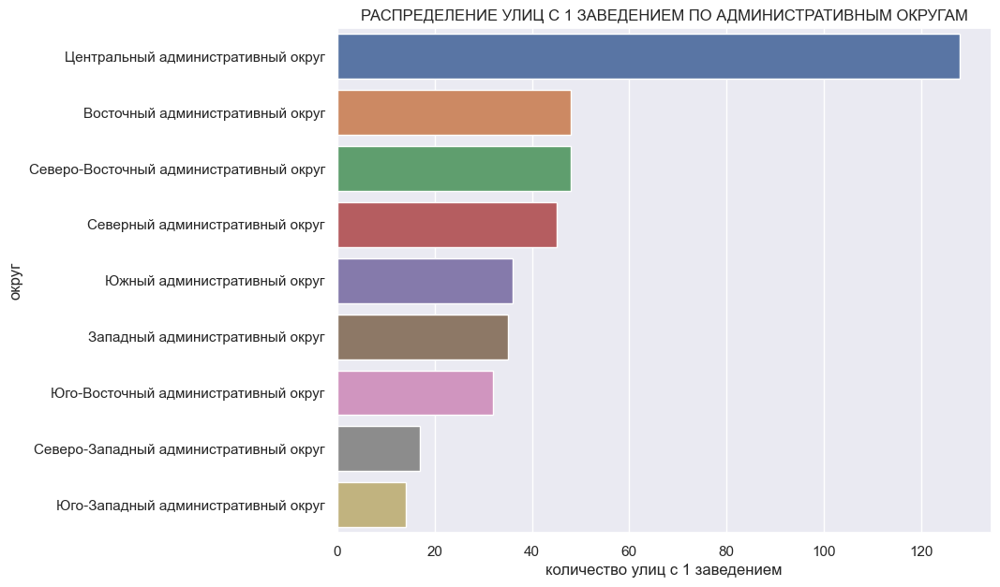

In [154]:
x = one_street.groupby('district')['street'].count().sort_values(ascending=False)
y = one_street.groupby('district')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_street.reset_index())

plt.title('РАСПРЕДЕЛЕНИЕ УЛИЦ С 1 ЗАВЕДЕНИЕМ ПО АДМИНИСТРАТИВНЫМ ОКРУГАМ')
plt.xlabel('количество улиц с 1 заведением')
plt.ylabel('округ')

plt.show()

Изучим, к какой категории относятся данные заведения

In [155]:
one_street.groupby('category')['street'].count().sort_values(ascending=False)

category
кафе               133
ресторан            86
кофейня             70
бар,паб             38
столовая            36
быстрое питание     17
пиццерия            14
булочная             9
Name: street, dtype: int64

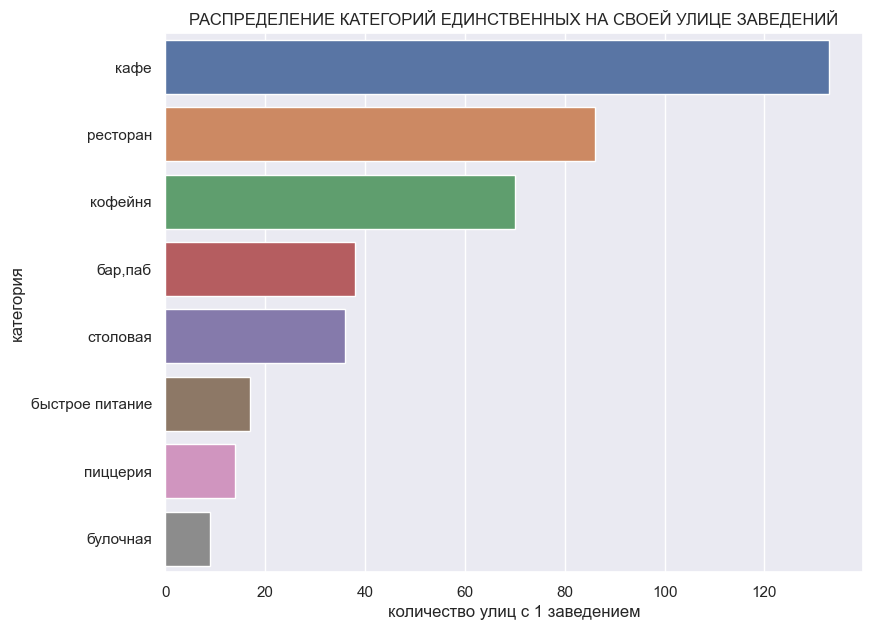

In [156]:
x = one_street.groupby('category')['street'].count().sort_values(ascending=False)
y = one_street.groupby('category')['street'].count().sort_values(ascending=False)\
    .index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_street.reset_index())

plt.title('РАСПРЕДЕЛЕНИЕ КАТЕГОРИЙ ЕДИНСТВЕННЫХ НА СВОЕЙ УЛИЦЕ ЗАВЕДЕНИЙ')
plt.xlabel('количество улиц с 1 заведением')
plt.ylabel('категория')

plt.show()

Узнаем средний рейтинг заведений, единственных на своей улице

In [157]:
one_street.groupby('category')['rating'].mean().sort_values(ascending=False)

category
бар,паб            4.471053
булочная           4.400000
пиццерия           4.385714
кофейня            4.317143
столовая           4.244444
ресторан           4.233721
кафе               4.141353
быстрое питание    4.141176
Name: rating, dtype: float64

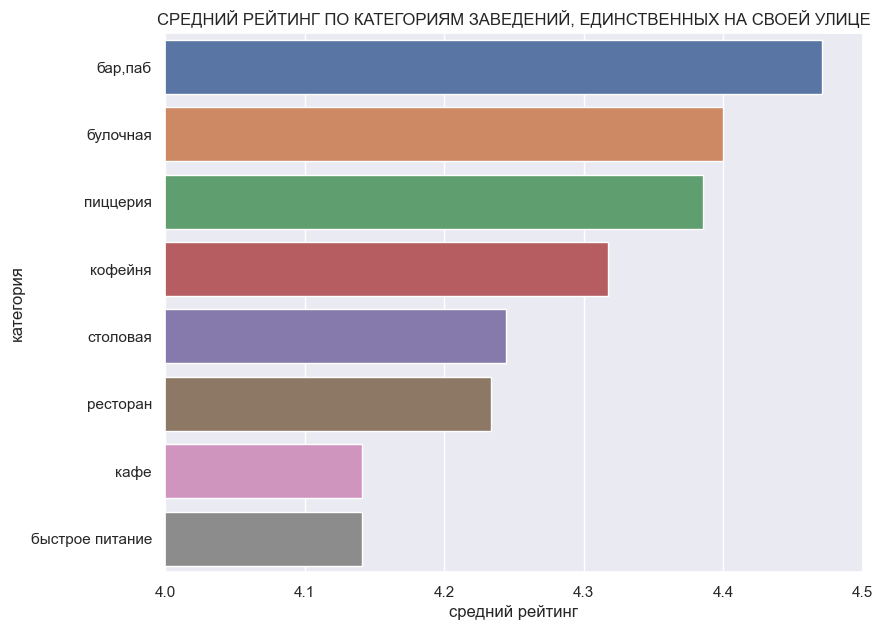

In [158]:
x = one_street.groupby('category')['rating'].mean().sort_values(ascending=False)
y = one_street.groupby('category')['rating'].mean().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_street.reset_index())
plt.xlim(4, 4.5)

plt.title('СРЕДНИЙ РЕЙТИНГ ПО КАТЕГОРИЯМ ЗАВЕДЕНИЙ, ЕДИНСТВЕННЫХ НА СВОЕЙ УЛИЦЕ')
plt.xlabel('средний рейтинг')
plt.ylabel('категория')

plt.show()

Чаще всего единственным заведением на одной улице бывают кафе, больше всего заведений без конкурентов на улице расположено в Центральном административном округе, рейтинг таких раведений выше у баров, пабов.
В целом, рейтинг единственных на своей улице заведений больше 4.1, что является достаточно хоорошим показателем.

### Определим значения средних чеков заведений для каждого района:

Посчитаем медиану этого столбца для каждого района. 

In [159]:
data[data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)].groupby('district')[
    'middle_avg_bill'].median().sort_values(ascending=False)

district
Центральный административный округ         905.0
Западный административный округ            750.0
Северо-Западный административный округ     675.0
Северный административный округ            600.0
Юго-Западный административный округ        600.0
Восточный административный округ           500.0
Северо-Восточный административный округ    500.0
Южный административный округ               500.0
Юго-Восточный административный округ       434.0
Name: middle_avg_bill, dtype: float64

Будем использовать это значение в качестве ценового индикатора района. 

Построим фоновую картограмму с полученными значениями для каждого района.

In [160]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = data[data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)].groupby('district')[
    'middle_avg_bill'].mean()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

m

- Медианная стоимость заказа в `Центральном и Западным` административным округом составляет `886-945` рублей.
- В `Северном, Северо-Западном и Юго-Западном` административном округе медианная стоимость чуть ниже, - `769-827` рублей.
- В `Южном и Восточном` административном округе `651-710` рублей.
- В `Северо-Восточном и Юго-Восточном` административном округе - `592-651` рубль.

Как видно из графиков, `более 50% заведений - это кафе (в количестве 2378) и рестораны (2043)`, кафе при этом на 4% больше. `Третьи по численности - кофейни`, на них приходится около `17% - 1413 штук`. 
Меньше всего по `3-4% приходится на столовые и булочные`.


С количеством `посадочных мест более 200` встречаются `кафе, рестораны и кофейни`, при этом заведения этих категорий встречаются и с меньшим количеством мест - до 50. Распределение мест для пиццерий и заведений быстрого питания примерно одинаково. Меньше всего посадочных мест предусмотрено в столовых и булочных.

`62%` заведений датасета - `несетевые`. 

Самая крупная сеть - `шоколадница`, в сети есть кофейни и кафе. 6 сетей с заведениями катеригории кофейня, 7 - кафе. 

В топ-15 по популятрности вошли в основном крупные федеральные сети.


В датафрейме представлено 9 административных округов: `Северный, Северо-Восточный, Северо-Западный, Западный, Центральный, Восточный, Юго-Восточный, Южный, Юго-Западный административный округ`.

Мы построили график распределения общего количества заведений и количества заведений по категориям для каждого административного округа. Самые `распространненные` категории, как указано выше - `кафе, рестораны и кофейни`. В Центральном административном округе большое количество баров, пабов (примерно такое же, как в остальных округах в сумме). Количество заведений типов пиццерия, быстрое питание, столовая, булочная меньше во всех районах. Остальные категории менее популярны. Отметим, что по количеству заведений всех типов лидирует Центральный АО, а Северо-Западный отстает так же по всем позициям. В остальных округах распределение почти равномерное.

Для кофеен наибольшая конкуренция определяется в `ЦАО(428 заведений)`, наименьшая в ВАО (105 кофеен), ЮЗАО(96), ЮВАО(89) и `ЮЗАО(62)`.

В распределении по улицам, `больше всего заведений (более 180) распологается на Проспекте Мира`, в том числе 36 кофеен, 45 ресторанов и 53 кафе, `меньше всего` кофеен (4) встречается на `улице Миклухо-Маклая`.

Чаще всего единственным заведением на одной улице бывают кафе, больше всего заведений `без конкурентов` на улице расположено в `Центральном административном округе`, рейтинг таких раведений выше у баров, пабов.

Медианная стоимость заказа в `Центральном и Западным` административным округом составляет `886-945` рублей.
В `Северном, Северо-Западном и Юго-Западном` административном округе медианная стоимость чуть ниже, - `769-827` рублей.
В `Южном и Восточном` административном округе `651-710` рублей.
В `Северо-Восточном и Юго-Восточном` административном округе - `592-651` рубль.


##  Детализируем исследование: `открытие кофейни`
Мечта основателей фонда «Shut Up and Take My Money» — открыть такую же крутую и доступную кофейню в Москве, как «Central Perk»в сериале «Друзья». Известно, что заказчики не боятся конкуренции в данной сфере, ведь кофеен в больших городах уже достаточно.

### Определим, сколько всего кофеен в датасете

In [161]:
coffee_house = data[data['category'] == 'кофейня']
print('Всего кофеен в Москве:', len(coffee_house))

Всего кофеен в Москве: 1413


### Узнаем, в каких районах их больше всего

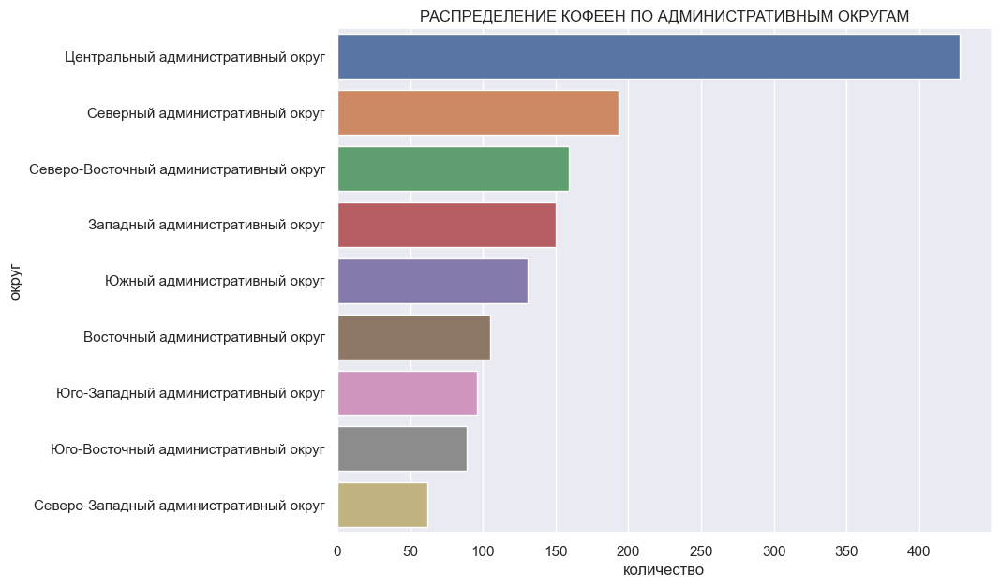

In [162]:
x = coffee_house.groupby('district')['name'].count().sort_values(ascending=False)
y = x.index

fig = plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=coffee_house.reset_index())

plt.title('РАСПРЕДЕЛЕНИЕ КОФЕЕН ПО АДМИНИСТРАТИВНЫМ ОКРУГАМ')
plt.xlabel('количество')
plt.ylabel('округ')

plt.show()

Определим особенности расположения:

In [163]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = coffee_house.groupby('district')['name'].count()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.4,
    legend_name='Концентрация кофеен по административным округам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_house.apply(create_clusters, axis=1)

m

Больше всего кофеен в `Центральном` административном округе, и составляет примерно `376-428 кофеен`, что почти в 2 раза больше, чем любом другом административном округе. 

Меньше всего кофеен в `Северо-Западном и Юго-Восточном` административном округе.
Плотность распределения заведений заметно уменьшается с удалением от центра города. 

### Определим,  сколько кофеен работают круглосуточно

In [164]:
print('Доля круглосуточных кофеен:', round(100* len(coffee_house[coffee_house['is_24/7']\
                                                == 1]) / len(coffee_house)), '%')

Доля круглосуточных кофеен: 4 %


### Рассмотрим рейтинги кофеен в распределении по районам

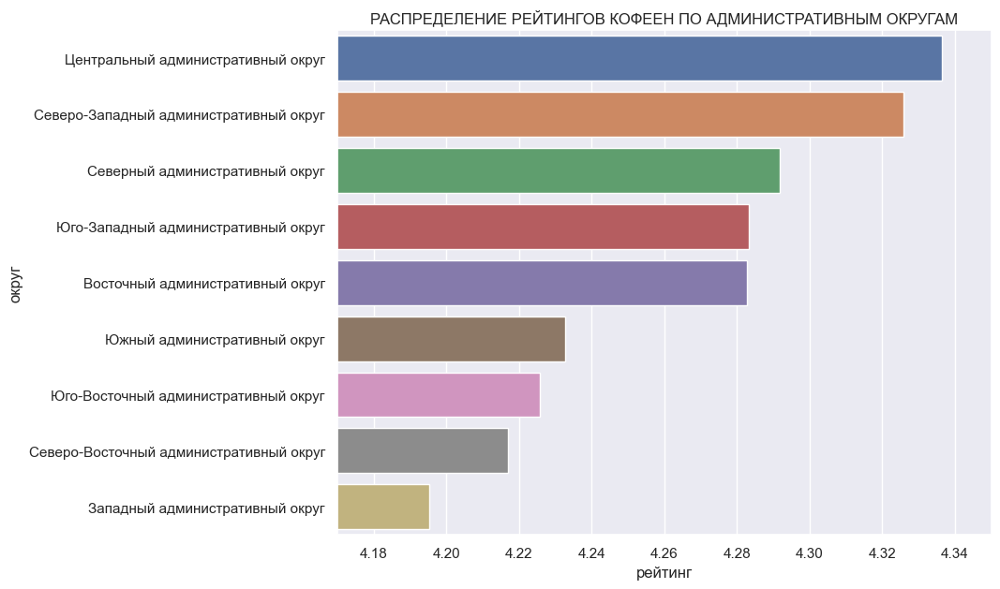

In [165]:
x = coffee_house.groupby('district')['rating'].mean().sort_values(ascending=False)
y = x.index

fig = plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=coffee_house.reset_index())
plt.xlim(4.17, 4.35)

plt.title('РАСПРЕДЕЛЕНИЕ РЕЙТИНГОВ КОФЕЕН ПО АДМИНИСТРАТИВНЫМ ОКРУГАМ')
plt.xlabel('рейтинг')
plt.ylabel('округ')

plt.show()

Самый высокий средний `рейтинг` у кофеен `Центрального АО (4.33)`, чуть ниже в Северо-Западном.  Самый низкий средний рейтинг у кофеен Южного, Юго-Восточного, Северо-Восточного и Западного административных округов.


Определим особенности распределения рейтингов по районам:

In [166]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = coffee_house.groupby('district')['rating'].mean()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_house.apply(create_clusters, axis=1)

m

Наиболее высокий средний рейтинг у кофеен расположенных в Центральном, Северо-Западном и Северном административных округах.

### Определим ориентировочную стоимость чашки капучино в новом заведении 

In [167]:
print('Средняя стоимость чашки капучино', round(data[data[
    'middle_coffee_cup'] < np.quantile(data[~data[
    'middle_coffee_cup'].isna()][
    'middle_coffee_cup'], 0.95)][
    'middle_coffee_cup'].mean(),1), 'р.')

Средняя стоимость чашки капучино 164.6 р.


In [168]:
coffee_price = round(coffee_house[coffee_house[
    'middle_coffee_cup'] < np.quantile(coffee_house[~coffee_house[
    'middle_coffee_cup'].isna()][
    'middle_coffee_cup'], 0.95)].groupby(['district'],as_index=False)[
    'middle_coffee_cup'].mean(), 1)
coffee_price

,district,middle_coffee_cup
0,Восточный административный округ,140.0
1,Западный административный округ,178.8
2,Северный административный округ,158.1
3,Северо-Восточный административный округ,156.6
4,Северо-Западный административный округ,165.5
5,Центральный административный округ,177.8
6,Юго-Восточный административный округ,144.3
7,Юго-Западный административный округ,180.9
8,Южный административный округ,152.8


Самая высокая стоимость чашки капучино в `Юго-Западном` (`180.9 р`), `Западном` (`178.8 р`) и `Центральном` (`177.8 р`) административных округах. Самая низкая - в `Восточном` административном округе (`140 р`).


Больше всего кофеен в `Центральном` административном округе, в количестве 376-428 что почти в 2 раза больше, чем любом другом административном округе. при этом и средний рейтинг кофеен Центрального АО выше, чем в других районах(и составляет 4.33), а стоимость чашки капучино (177.8 р), что в среднем дешевле, чем в `Юго-Западном` и `Западном округах` на 3.1 и 1 рубль соответственно.

Несмотря на большую стоимость чашки капучино в Западном округе, рейтинг заведений с данным местоположением самый низкий.




## Рекомендации 

Как было указано в требованиях, заказчик не боится конкуренции при открытии кофейни по мотивам сериала "Friends".


Перечислим районы с указанием существующих на момент исследования кофеен: наибольшее число - в Центральном административном округе(428 заведений), наименьшее в Восточном(105 кофеен), Юго-Западном(96), Юго-Восточном(89) и Северо-Западном(62) административных округах.


Исходя из анализа, наиболее подходящим округом для открытия кофейни выбираем **Северо-Западный административный округ**.


- По рейтингу уже имеющихся заведений, Северо-Западный округ занимает второе место после Центрального, со `средним рейтингом 4.33`.
- На момент анализа, в СЗАО всего `62 кофейни` и плотность их распределения уменьшается с удалением от центра города. Однако, и средняя стоимость чашки капучино уменьшается с удалением от центра - поэтому мы бы рекомендовали рассматривать улицы ближе к Центральному округу.
- Отметим, что в СЗАО всего 17 улиц с 1 заведением, но встречаются улицы, где пока нет ни одного заведения.
- Средний чек составляет `675`.0, что выше более чем `на 10%`, чем в 5 других районах.
- При открытии кофейни можем рассчитывать на среднюю стоимость чашки капучино `165.5` рублей при средней стоимости по Москве всего на 0.1рубля больше.






Кроме того, отметим, что лишь `4 %` кофеен `работает круглосуточно`. Поэтому круглосуточный формат работы мог бы стать преимуществом (при условии хорошей рентабельности, что требует дополнительных расчетов). 



## [Презентация](https://drive.google.com/file/d/1NNfeGjcBvfBFRjWnT4qoiOEMx0i001l9/view?usp=sharing)


